# Advanced Lane Finding Project
---

**Advanced Lane Finding Project**

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.







## Import packages

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
import os
import glob

## Camera calibrition
---
In this section, the chessboard images provided will be un-distorted and the calibration matrix will be calculated.

In [2]:
imgs = glob.glob('camera_cal/calibration*.jpg')

# arrays to store object points and image points from all the images
objpoints = [] 
imgpoints = []

# obj points preparation
objp = np.zeros((6*9,3),np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2) # x,y coordinate 
for fname in imgs:
    img = mpimg.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret,corners = cv2.findChessboardCorners(gray , (9,6), None)
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)
        #cv2.drawChessboardCorners(img, (9,6), corners,ret)
        #f, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))
        #ax1.imshow(cv2.cvtColor(mpimg.imread(fname), cv2.COLOR_BGR2RGB))
        #ax1.set_title('Original Image', fontsize=18)
        #ax2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        #ax2.set_title('With Corners', fontsize=18)


Here we will define a calculation of undistort function:

In [3]:
def cal_undistort(img,read,plot):
    if read == True:
        img = mpimg.imread(img)
    img_size = (img.shape[1],img.shape[0])
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    if plot == True:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,9))
        f.tight_layout()
        ax1.imshow(img)
        ax1.set_title('Original Image',fontsize = 50)
        ax2.imshow(undist)
        ax2.set_title('Undistorted Image',fontsize = 50)
    return undist   

By using the objpoints and imgpoints matrix from the chessboard, we can calculate the distortion matrix. And we take the chessboard figure 'calibration2' as an example to undistort.

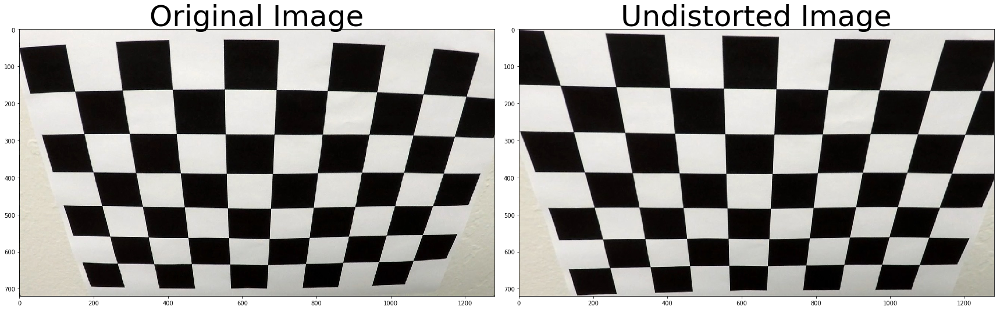

In [4]:
img = mpimg.imread('camera_cal/calibration2.jpg')
calibration2 = cal_undistort(img,False,True)


# Pipeline construction

In this pipline, we will follow the course instruction's order to process the images:

* Undistort the original images
* Find the binary selection of the images by combined color and gradient threshold to the undistorted images
* Apply perspective transformation to the binary images
* Measure the curvature and fit a polynomial for the lane lines
* Plot out the found lane lines on the image/vedio


##   Undistort the test images

Now we use the algorithms we developed previously to undistort the test images 

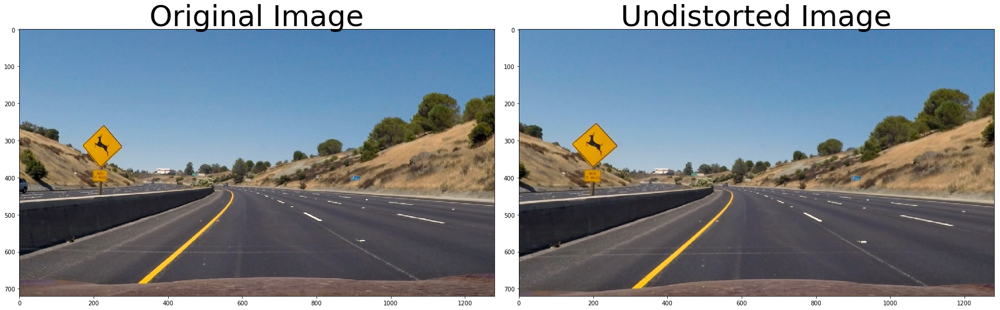

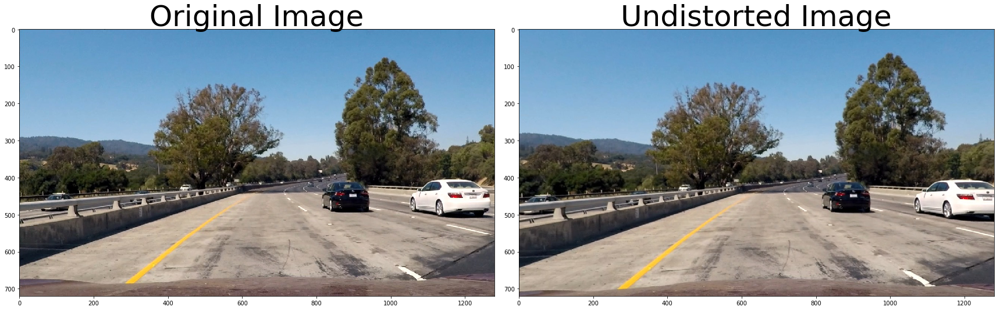

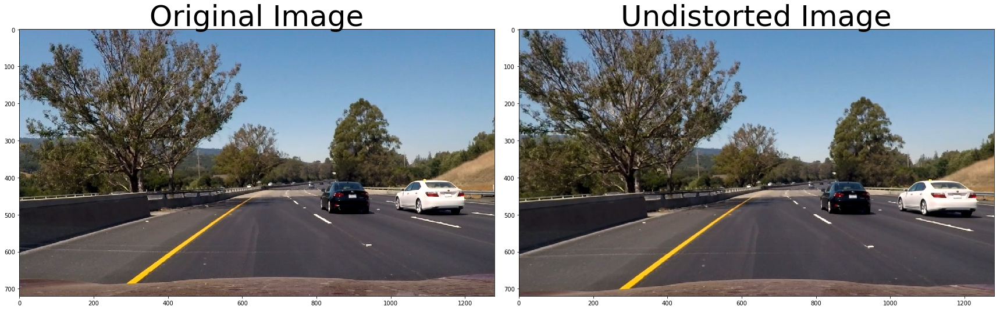

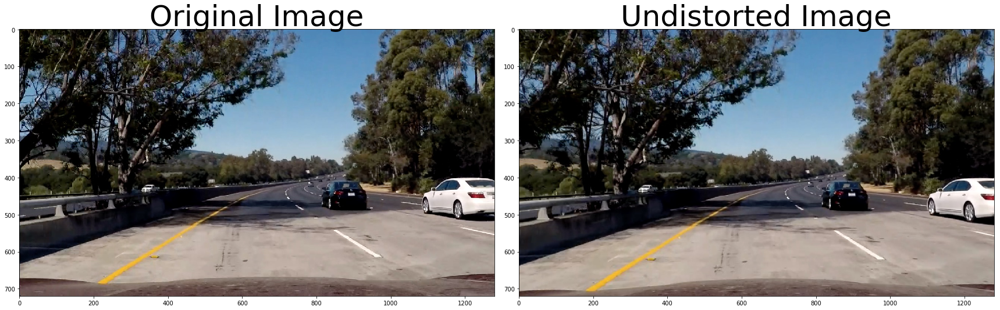

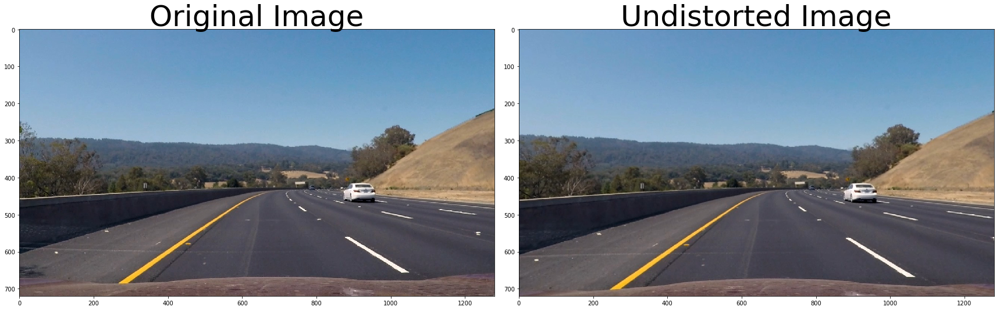

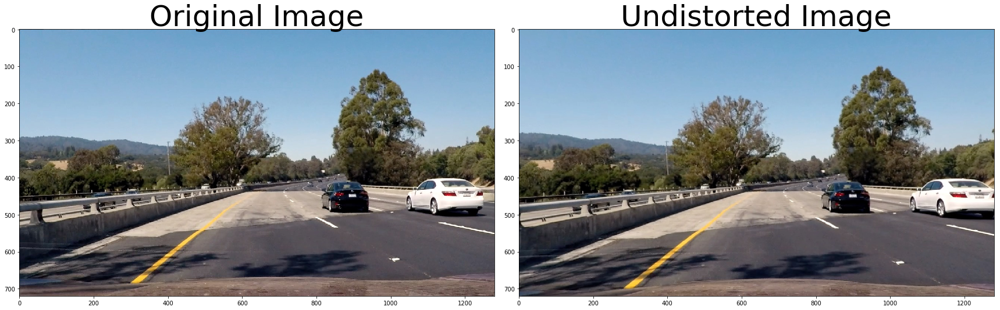

In [5]:
images = glob.glob('test_images/test*.jpg')
for image in images:
    undist = cal_undistort(image,True,True)

## Find the binary selections of the images

Here we combine the color and gradient threshold to get the best binary thresholded image.

In [6]:
def combine_binay(img,read,display):
    if read == True:
        img = mpimg.imread(img)        
    
    
    img = np.copy(img)    
    # Convert to HLS color space and separate the V channel
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    h_channel = hsv[:,:,0]
    s_channel = hsv[:,:,1]
    v_channel = hsv[:,:,2]
    
    img = np.copy(img)   
    #Define parameters
    white_low = (0, 0, 233)
    white_high =(90, 63, 255)
    yellow_low = (15, 127, 213)
    yellow_high = (30, 255, 255)
    
    
    
    white_binary = cv2.inRange(hsv,white_low,white_high)
    yellow_binary = cv2.inRange(hsv,yellow_low,yellow_high)
    combine_bi = cv2.bitwise_or(white_binary,yellow_binary)
    if display == True:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24,9))
        f.tight_layout()
        ax1.imshow(cal_undistort(img,False,False))
        ax1.set_title('Undistorted Image',fontsize = 50)
        ax2.imshow(combine_bi, cmap='gray')
        ax2.set_title('Selected Binary', fontsize=50)
        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    return combine_bi

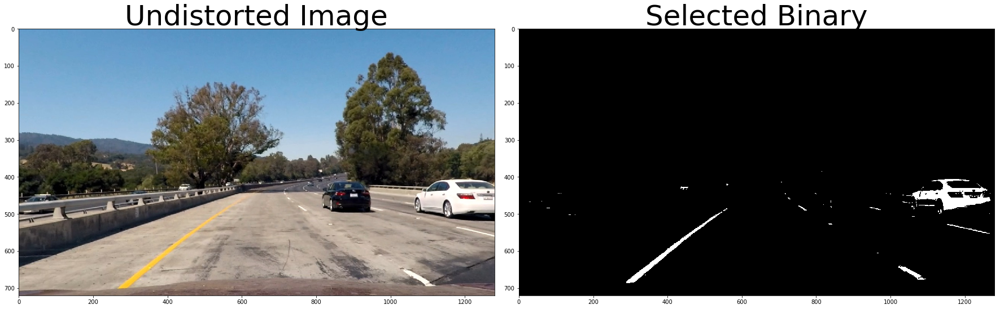

In [7]:
image = mpimg.imread('test_images/test1.jpg')
binary = combine_binay(image,False,True)

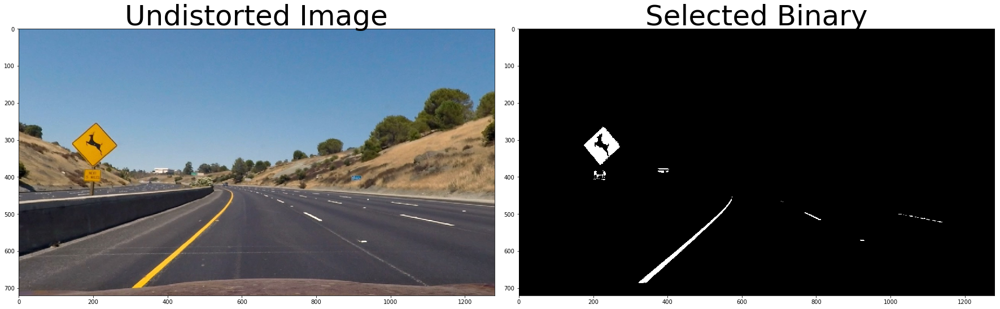

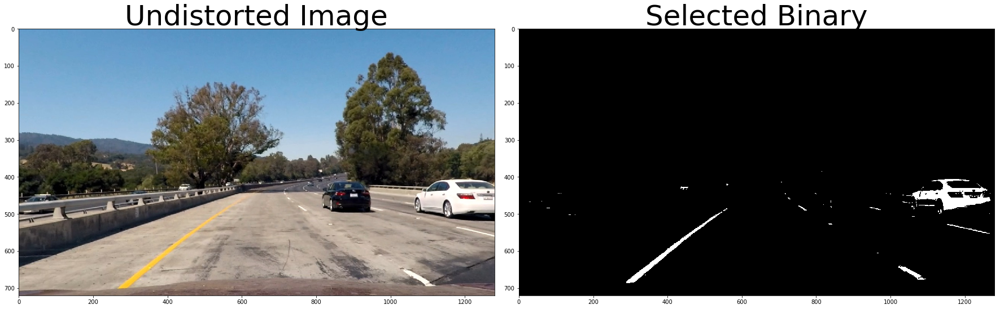

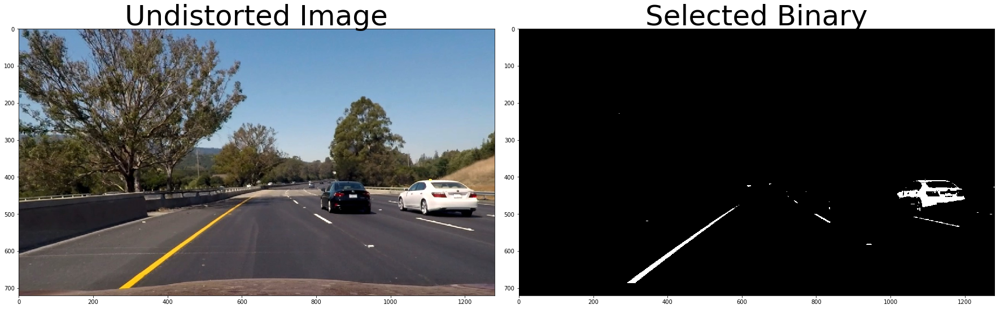

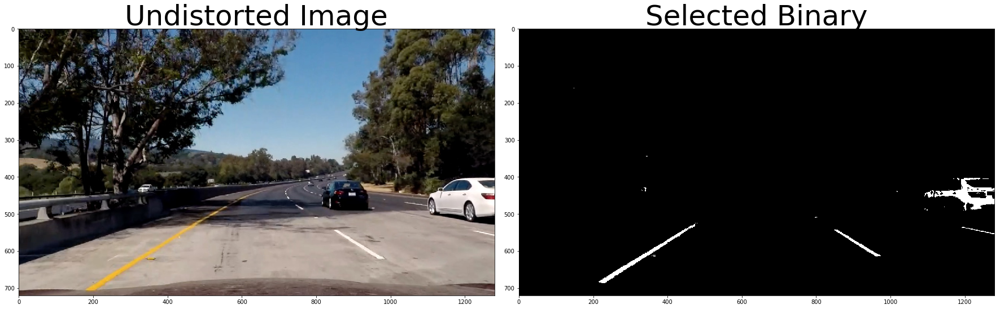

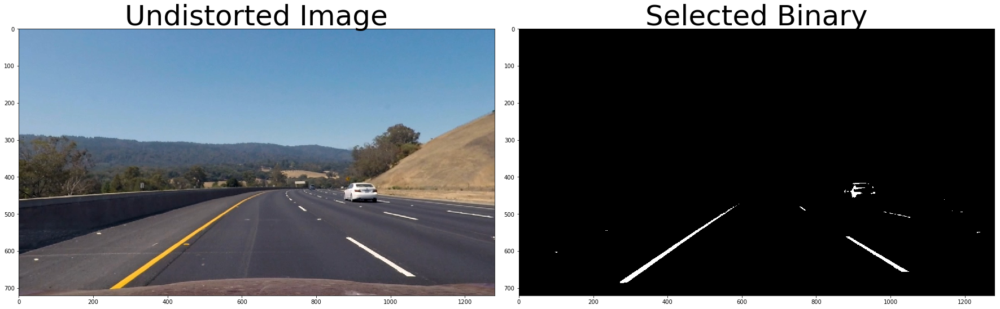

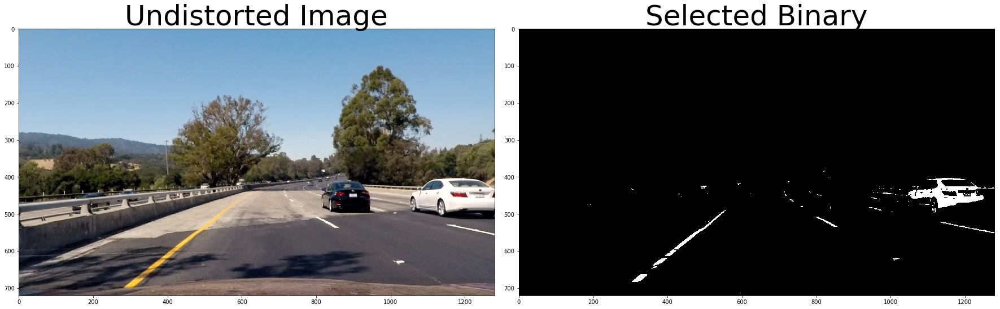

In [8]:
images = glob.glob('test_images/test*.jpg')
for image in images:
    binary = combine_binay(image,True,True)

## Perspective transformation


In [9]:
def corners_unwarp(img,read,display,inv):
    if read == True:
        img = mpimg.imread(img)
    src = np.float32(
        [[500,480],
         [800,480],
         [1200,700],
         [100,700]])
    dst = np.float32(
        [[0,0],
         [1200,0],
         [1200,700],
         [0,700]])
    img_size = (img.shape[1],img.shape[0])
    M = cv2.getPerspectiveTransform(src, dst)
    M_inv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    warped_bi = combine_binay(warped,False,False)
    if display == True:
        f, (ax1,ax2) = plt.subplots(1,2,figsize = (20,10))
        ax1.set_title('Original')
        ax1.imshow(img)
        ax2.set_title('Wraped')
        ax2.imshow(warped,cmap='gray')
    if inv == True:
        return M_inv,warped_bi, warped
    else:
        return warped_bi, warped

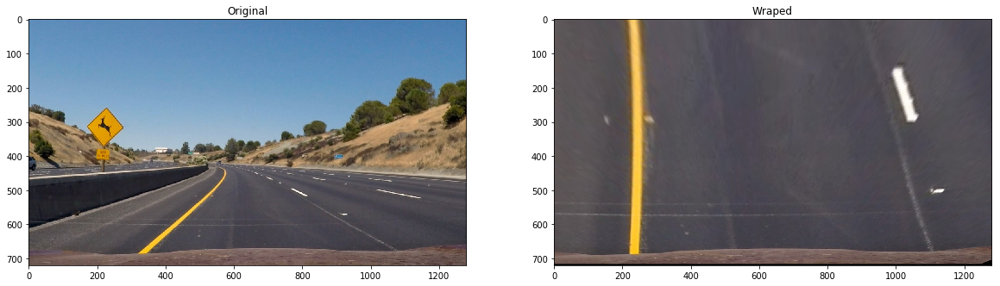

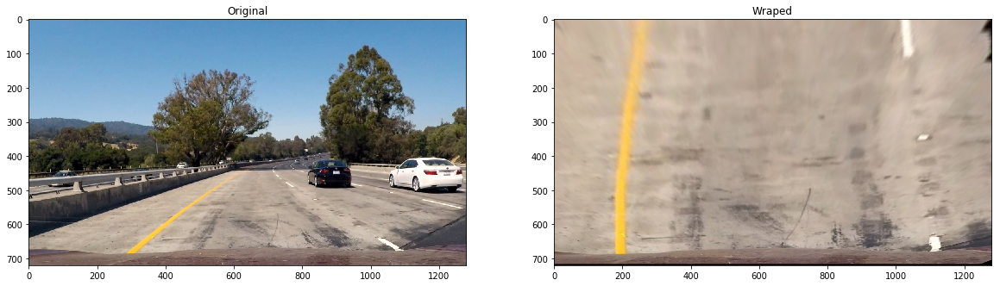

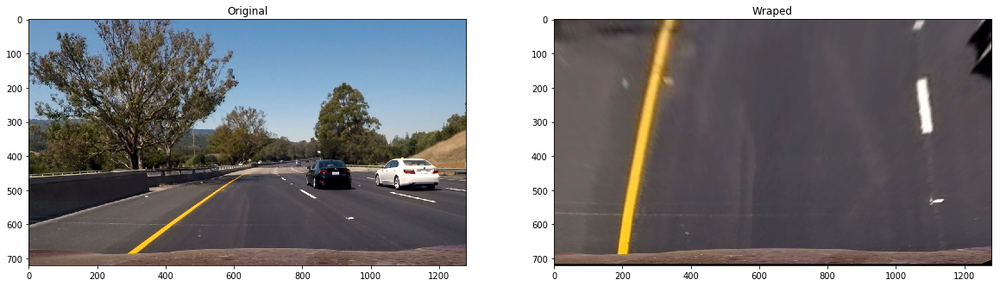

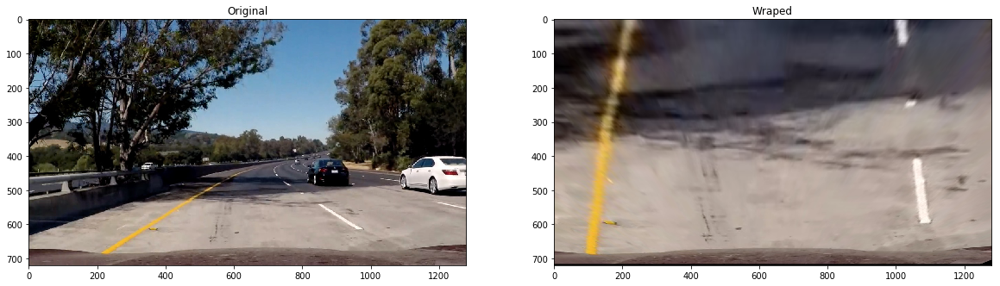

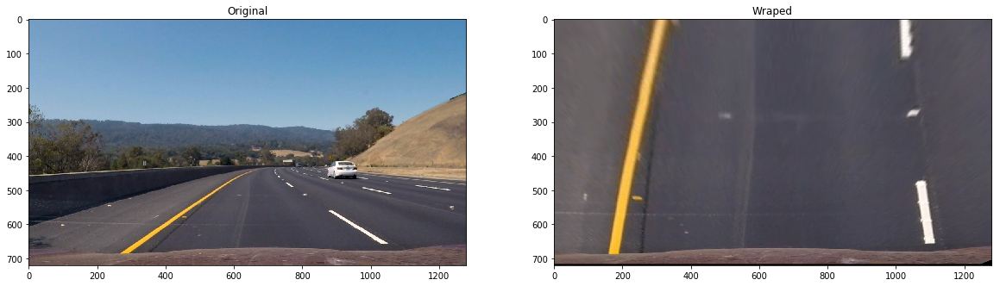

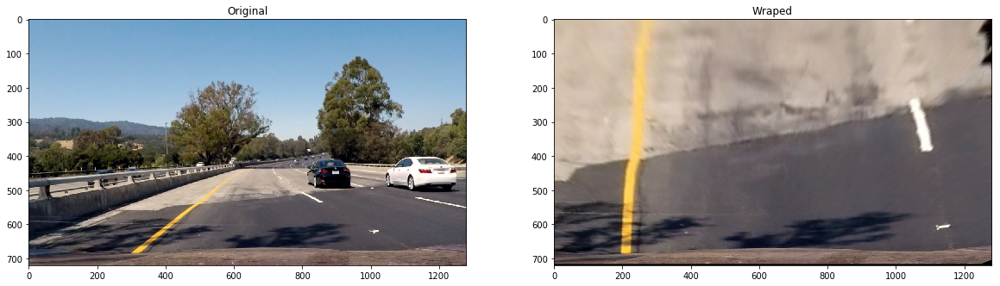

In [10]:
images = glob.glob('test_images/test*.jpg')
for image in images:
    binary,warped = corners_unwarp(image,True,True,False)

## Lane finding using peaks in a histogram

### Finding the lane line with fitted curves

In [11]:
def fit_polynomial(img):
    M_inv,binary_warped,warped = corners_unwarp(img,False,False,True)
    binary_all = combine_binay(img,False,False)
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # HYPERPARAMETERS
    # Check or not the windows
    w_check = False
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin   # Update this
        win_xleft_high = leftx_current + margin  # Update this
        win_xright_low = rightx_current - margin  # Update this
        win_xright_high = rightx_current + margin  # Update this
        
        if w_check == True:
            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),
            (win_xleft_high,win_y_high),(0,255,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),
            (win_xright_high,win_y_high),(0,255,0), 2) 
        
        ### TO-DO: Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    dots = False

    left_fit = np.polyfit(lefty,leftx,2)
    right_fit = np.polyfit(righty,rightx,2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        ym_per_pix = 30/720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meters per pixel in x dimension
        y_eval = np.max(ploty)
        y_eval = y_eval*ym_per_pix
        left_fit_real = np.polyfit(lefty*ym_per_pix,leftx*xm_per_pix,2)
        right_fit_real = np.polyfit(righty*ym_per_pix,rightx*xm_per_pix,2)
        left_curverad = ((1 + (2*left_fit_real[0]*y_eval + left_fit_real[1])**2)**1.5) / np.absolute(2*left_fit_real[0])
        right_curverad = ((1 + (2*right_fit_real[0]*y_eval + right_fit_real[1])**2)**1.5) / np.absolute(2*right_fit_real[0])
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty
        
        
    # Find the position of the vehicle
    start_ind = binary_warped.shape[0]-1
    left_start = left_fitx[start_ind]
    right_start = right_fitx[start_ind]
    center_pos = (left_start+right_start)/2
    offset = 640 - center_pos
        
    # Create an image to draw the lines on    
    warp_zero = np.zeros_like(binary_all).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.flipud(np.transpose(np.vstack([left_fitx, ploty])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, ploty]))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, M_inv, (binary_all.shape[1], binary_all.shape[0]))
    
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.5, 0)
    
    f, (ax1, ax2) = plt.subplots(1,2, figsize=(9, 6))
    f.tight_layout()
    ax1.imshow(warped)
    ax1.set_xlim(0, 1280)
    ax1.set_ylim(0, 720)
    ax1.plot(left_fitx, ploty, color='green', linewidth=3)
    ax1.plot(right_fitx, ploty, color='green', linewidth=3)
    ax1.set_title('Top view of the Lane line', fontsize=16)
    ax1.invert_yaxis() # to visualize as we do the images
    ax2.imshow(result)
    ax2.set_title('Normal View of the lane line', fontsize=16)
    ax2.text(100,100, 'Radius of left lane curvature is : % .1f m' %left_curverad
            , color='white', fontsize=10)
    ax2.text(100,150, 'Radius of right lane curvature is : % .1f m' %right_curverad
            , color='white', fontsize=10)
    if offset > 0:
        ax2.text(100,200, 'The vehicle is : % .1f m left to the center' %np.absolute(offset)
            , color='white', fontsize=10)
    elif offset < 0:
        ax2.text(100,200, 'The vehicle is : % .1f m right to the center' %np.absolute(offset)
            , color='white', fontsize=10)
    else:
        ax2.text(100,200, 'The vehicle is at the center'
            , color='white', fontsize=10)
    return result

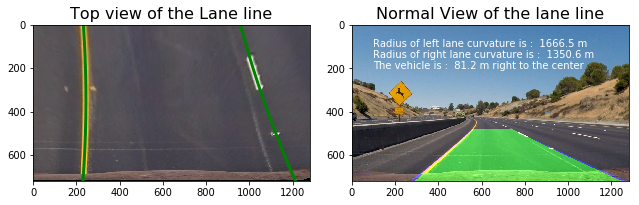

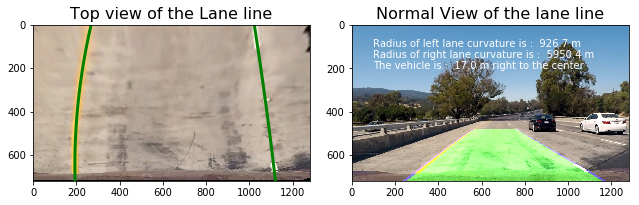

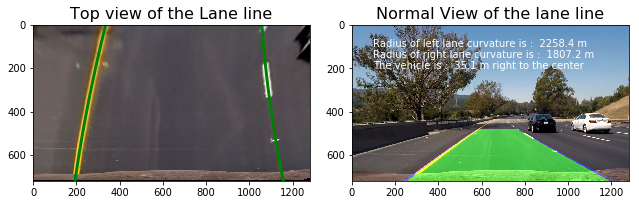

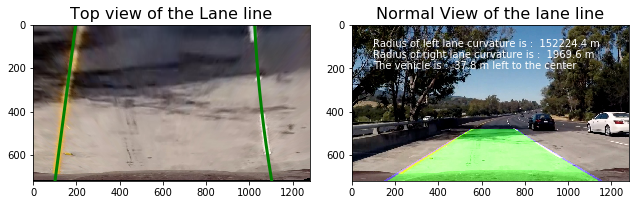

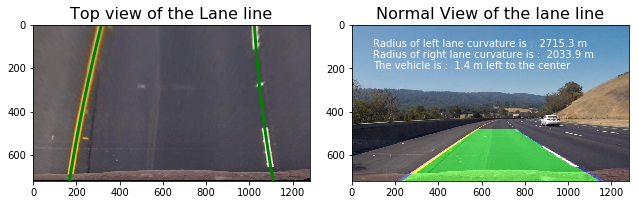

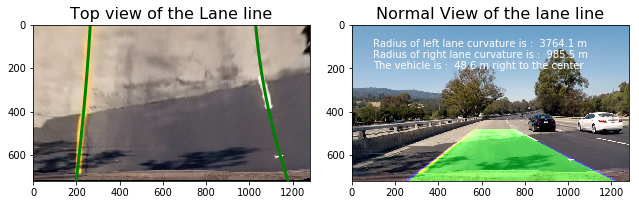

In [12]:
images = glob.glob('test_images/test*.jpg')
for image in images:
    img = mpimg.imread(image)
    fit_polynomial(img)

# Vedio Pipline

In [13]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [49]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self,name):
        # was the line detected in the last iteration?
        self.name = name
        self.detected = False  
        # polynomial values of the last n fits of the line
        self.recent_fitted = []   
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = [0,0,0]  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None 
        # count the number of frames
        self.count = 0

        
        
    def found(self,x,y):
        if self.detected == True:
            fit = self.best_fit
            margin = 100
            lane_indx = ((x > (fit[0]*(y**2)+fit[1]*y+fit[2]-margin)) & (x < (fit[0]*(y**2)+fit[1]*y+fit[2]+margin)))
            x_new = x[lane_index]
            y_new = y[lane_index]
            if np.sum(x_new) != 0:
                self.detected = True
                self.count += 1  
                self.allx = x_new
                self.ally = y_new
                self.current_fit = np.polyfit(y_new,x_new,2) 
                # if the number of the frame is smaller than n = 10, we don't delete the previous one
                if self.count <= 100:
                    self.recent_fitted = np.append(self.recent_fitted,self.current_fit, axis=0)
                    self.best_fit = np.mean(self.recent_fitted, axis=0)
                else:
                    self.recent_fitted = np.delete(self.recent_fitted,0,0)
                    self.recent_fitted = np.append(self.recent_fitted,self.current_fit, axis=0)
                    self.best_fit = np.mean(self.recent_fitted, axis=0)     
            if np.sum(x_new) == 0:
                self.detected = False 

            
    def blind(self,x,y,img):
        if self.detected == False:
            histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
            midpoint = np.int(histogram.shape[0]//2)
            margin = 25
            nwindows = 9
            minipix = 50
            window_height = np.int(img.shape[0]//nwindows)
            if self.name == 'left':
                base = np.argmax(histogram[:midpoint])               
            if self.name == 'right':
                base = np.argmax(histogram[midpoint:]) + midpoint
            x_current = base
            lane_inds = []
            for window in range(nwindows):
                win_y_low = img.shape[0] - (window+1)*window_height
                win_y_high = img.shape[0] - window*window_height
                win_x_low = x_current -margin
                win_x_high = x_current + margin
                good_inds = ((y >= win_y_low) & (y < win_y_high) & (x >= win_x_low) & (x < win_x_high)).nonzero()[0]
                lane_inds.append(good_inds)
                if len(lane_inds) >minipix:
                    x_current =  np.int(np.mean(x[good_inds]))
            lane_inds = np.concatenate(lane_inds)
            x_new = x[lane_inds]
            y_new = y[lane_inds]
            if np.sum(x_new) != 0:
                self.count += 1
                self.detected = True
                self.allx = x_new
                self.ally = y_new
                self.current_fit = np.polyfit(y_new,x_new,2) 
                # if the number of the frame is smaller than n = 10, we don't delete the previous one
                if self.count <= 100:
                    self.recent_fitted = np.append(self.recent_fitted,self.current_fit, axis=0)
                    self.best_fit = np.mean(self.recent_fitted, axis=0)
                else:
                    self.recent_fitted = np.delete(self.recent_fitted,0,0)
                    self.recent_fitted = np.append(self.recent_fitted,self.current_fit, axis=0)
                    self.best_fit = np.mean(self.recent_fitted, axis=0)
            if np.sum(x_new) == 0:
                self.detected = False 

        
    def curvature(self):
        ym_per_pix = 30./720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meteres per pixel in x dimension
        x_value = self.allx
        y_value = self.ally
        fit = np.polyfit(y_value*ym_per_pix, x_value*xm_per_pix, 2)
        self.radius_of_curvature = ((1 + (2*fit[0]*np.max(y_value) + fit[1])**2)**1.5) \
                                     /np.absolute(2*fit_cr[0])
        return self.radius_of_curvature
        

In [50]:
Left = Line('left')
Right = Line('right')
def video(img):

    
    ## Find the binary selection of the frame
    M_inv,binary_warped,warped = corners_unwarp(img,False,False,True)
    binary_all = combine_binay(img,False,False)
    nonzero = binary_all.nonzero()
    y = np.array(nonzero[0])
    x = np.array(nonzero[1])
    
    ploty = np.linspace(0, 719, 720)
    
    
    # Update the Left and Right object
    if Left.detected == True:
        Left.found(x,y)         
    if Right.detected == True:
        Right.found(x,y)      
    if Left.detected == False:
        Left.blind(x,y,binary_warped)      
    if Right.detected == False:
        Right.blind(x,y,binary_warped)
        
    print(Right.best_fit)
    
    left_fit = Left.best_fit
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fit = Right.best_fit
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
        
    # Find the position of the vehicle
    start_ind = binary_warped.shape[0]-1
    left_start = left_fitx[start_ind]
    right_start = right_fitx[start_ind]
    center_pos = (left_start+right_start)/2
    offset = 640 - center_pos
        
    # Create an image to draw the lines on    
    warp_zero = np.zeros_like(binary_all).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.flipud(np.transpose(np.vstack([left_fitx, ploty])))])
    pts_right = np.array([np.transpose(np.vstack([right_fitx, ploty]))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.polylines(color_warp, np.int_([pts]), isClosed=False, color=(0,0,255), thickness = 40)
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, M_inv, (binary_all.shape[1], binary_all.shape[0]))
    
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.5, 0)
    return result

In [51]:
white_output = 'project_out.mp4'

clip1 = VideoFileClip("project_video.mp4").subclip(0,1)
white_clip = clip1.fl_image(video)
%time white_clip.write_videofile(white_output,audio = False)

[0, 0, 0]
1749.68349835


IndexError: invalid index to scalar variable.

In [48]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

# Discussions

The lane detection pipline I developed works fine in the image finding. While in the video stream, it seems like the threshold value set for the binary selection is too strict and when the car comes to some place with limited light or the lane lines are shadowed by some obstacles (tree for example), the pipline will not work properly. To match the deadline as close as possible, I skip the part of tracking, sanity check, look-ahead filter, reset and smoothing. Since I'm a bit unfamiliar with oop, this remaining work will be continued with some more looks into the object oriented programming. 